In [4]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import warnings
import xgboost as xgb
import lightgbm as lgb
import os

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Dense, BatchNormalization, Input
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

from collections import Counter
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, LabelEncoder, MinMaxScaler
from sklearn.metrics import classification_report, confusion_matrix, recall_score, accuracy_score, precision_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from scipy.stats import randint

# import lazypredict
# from lazypredict.Supervised import LazyClassifier, LazyRegressor

warnings.filterwarnings("ignore")

In [5]:
# ! pip install imblearn

In [7]:
df = pd.read_csv('air_quality_health_impact_data/air_quality_health_impact_data.csv', sep=',')
df.head()

,RecordID,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore,HealthImpactClass
0,1,187.270059,295.853039,13.038560,6.639263,66.161150,54.624280,5.150335,84.424344,6.137755,7,5,1,97.244041,0.0
1,2,475.357153,246.254703,9.984497,16.318326,90.499523,169.621728,1.543378,46.851415,4.521422,10,2,0,100.000000,0.0
2,3,365.996971,84.443191,23.111340,96.317811,17.875850,9.006794,1.169483,17.806977,11.157384,13,3,0,100.000000,0.0
3,4,299.329242,21.020609,14.273403,81.234403,48.323616,93.161033,21.925276,99.473373,15.302500,8,8,1,100.000000,0.0
4,5,78.009320,16.987667,152.111623,121.235461,90.866167,241.795138,9.217517,24.906837,14.534733,9,0,1,95.182643,0.0


# Data Cleaning

In [8]:
df.isna().sum()

RecordID               0
AQI                    0
PM10                   0
PM2_5                  0
NO2                    0
SO2                    0
O3                     0
Temperature            0
Humidity               0
WindSpeed              0
RespiratoryCases       0
CardiovascularCases    0
HospitalAdmissions     0
HealthImpactScore      0
HealthImpactClass      0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5811 entries, 0 to 5810
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   RecordID             5811 non-null   int64  
 1   AQI                  5811 non-null   float64
 2   PM10                 5811 non-null   float64
 3   PM2_5                5811 non-null   float64
 4   NO2                  5811 non-null   float64
 5   SO2                  5811 non-null   float64
 6   O3                   5811 non-null   float64
 7   Temperature          5811 non-null   float64
 8   Humidity             5811 non-null   float64
 9   WindSpeed            5811 non-null   float64
 10  RespiratoryCases     5811 non-null   int64  
 11  CardiovascularCases  5811 non-null   int64  
 12  HospitalAdmissions   5811 non-null   int64  
 13  HealthImpactScore    5811 non-null   float64
 14  HealthImpactClass    5811 non-null   float64
dtypes: float64(11), int64(4)
memory usage:

In [10]:
df.drop(columns='RecordID', inplace=True)

In [11]:
columns_float = df.select_dtypes(include='float64')

for col in columns_float:
    df[col] = df[col].round(2)

df.head()

,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore,HealthImpactClass
0,187.27,295.85,13.04,6.64,66.16,54.62,5.15,84.42,6.14,7,5,1,97.24,0.0
1,475.36,246.25,9.98,16.32,90.50,169.62,1.54,46.85,4.52,10,2,0,100.00,0.0
2,366.00,84.44,23.11,96.32,17.88,9.01,1.17,17.81,11.16,13,3,0,100.00,0.0
3,299.33,21.02,14.27,81.23,48.32,93.16,21.93,99.47,15.30,8,8,1,100.00,0.0
4,78.01,16.99,152.11,121.24,90.87,241.80,9.22,24.91,14.53,9,0,1,95.18,0.0


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5811 entries, 0 to 5810
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   AQI                  5811 non-null   float64
 1   PM10                 5811 non-null   float64
 2   PM2_5                5811 non-null   float64
 3   NO2                  5811 non-null   float64
 4   SO2                  5811 non-null   float64
 5   O3                   5811 non-null   float64
 6   Temperature          5811 non-null   float64
 7   Humidity             5811 non-null   float64
 8   WindSpeed            5811 non-null   float64
 9   RespiratoryCases     5811 non-null   int64  
 10  CardiovascularCases  5811 non-null   int64  
 11  HospitalAdmissions   5811 non-null   int64  
 12  HealthImpactScore    5811 non-null   float64
 13  HealthImpactClass    5811 non-null   float64
dtypes: float64(11), int64(3)
memory usage: 635.7 KB


In [13]:
df.describe()

,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore,HealthImpactClass
count,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000,5811.000000
mean,248.438539,148.654965,100.223741,102.293512,49.456823,149.312380,14.975503,54.776901,9.989165,9.974187,4.988986,2.001033,93.785225,0.281191
std,144.777646,85.698541,58.096560,57.713222,28.530272,86.534179,14.483083,26.020802,5.776969,3.129234,2.216791,1.398794,13.318873,0.714075
min,0.010000,0.020000,0.030000,0.010000,0.010000,0.000000,-9.990000,10.000000,0.000000,1.000000,0.000000,0.000000,22.450000,0.000000
25%,122.950000,75.375000,49.435000,53.540000,24.885000,74.000000,2.480000,31.995000,4.950000,8.000000,3.000000,1.000000,98.205000,0.000000
50%,249.130000,147.630000,100.510000,102.990000,49.530000,149.560000,14.940000,54.540000,10.050000,10.000000,5.000000,2.000000,100.000000,0.000000
75%,373.630000,222.435000,151.340000,151.660000,73.345000,223.380000,27.465000,77.640000,14.975000,12.000000,6.000000,3.000000,100.000000,0.000000
max,499.860000,299.900000,199.980000,199.980000,99.970000,299.940000,39.960000,100.000000,20.000000,23.000000,14.000000,12.000000,100.000000,4.000000


# Exploratory Data Analysis

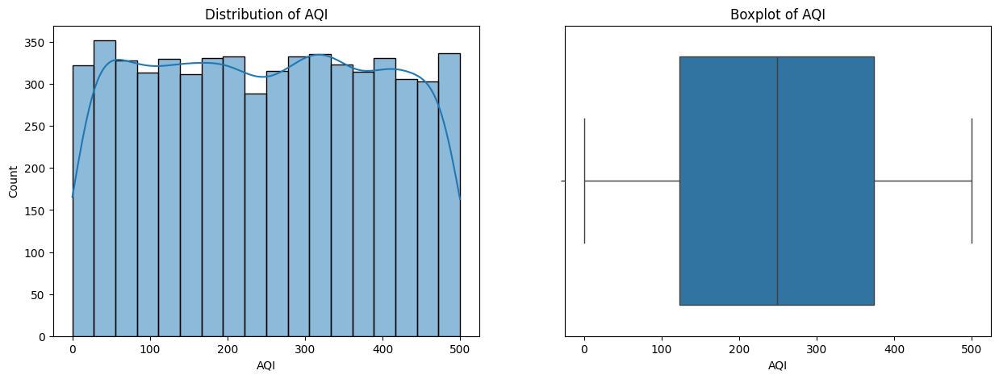

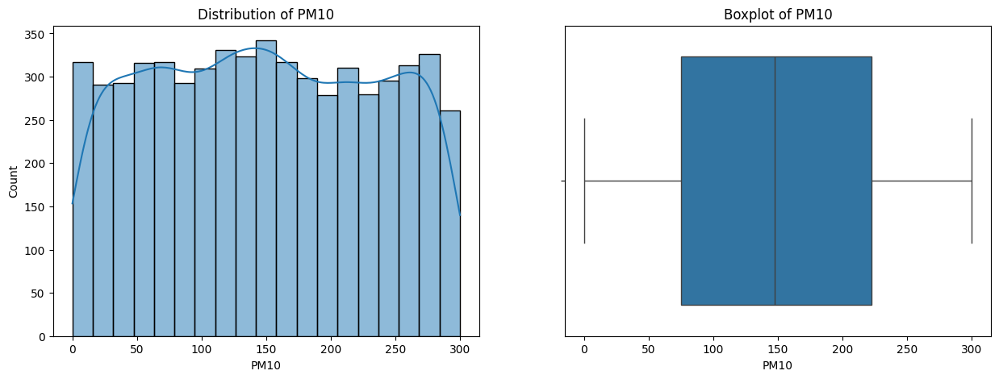

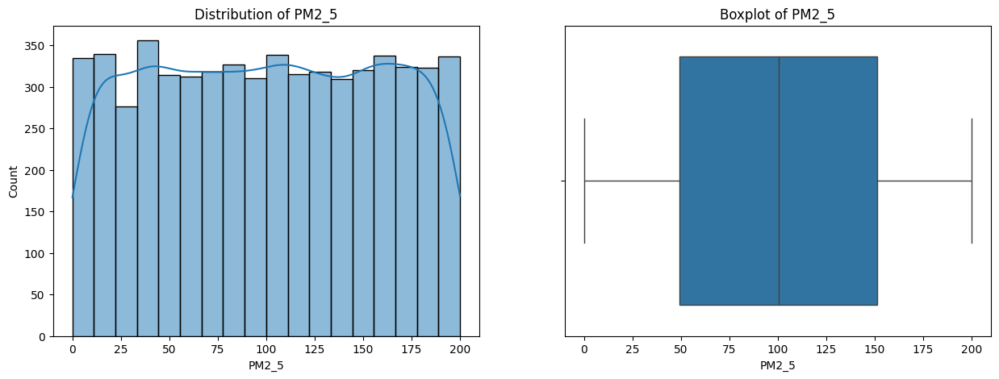

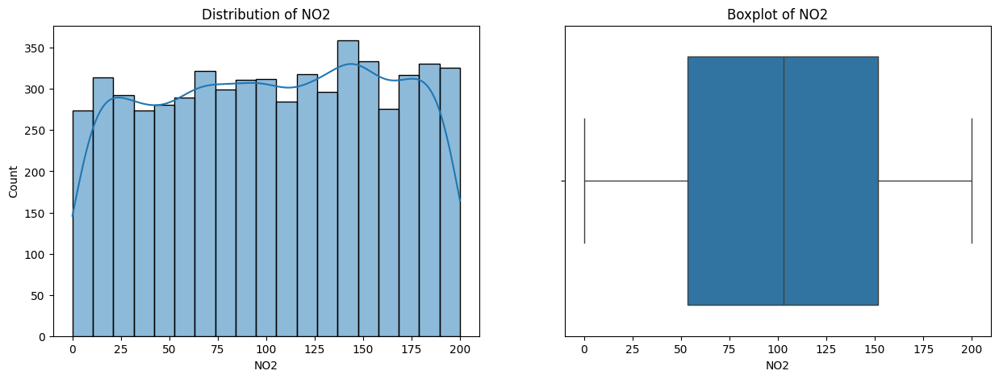

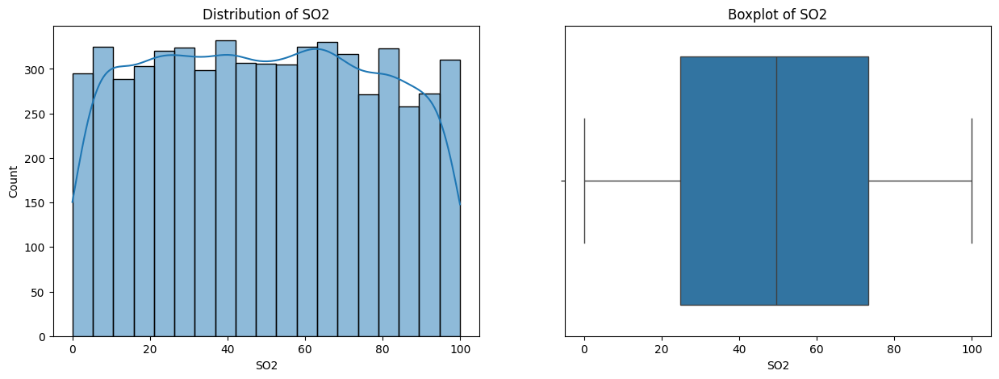

...

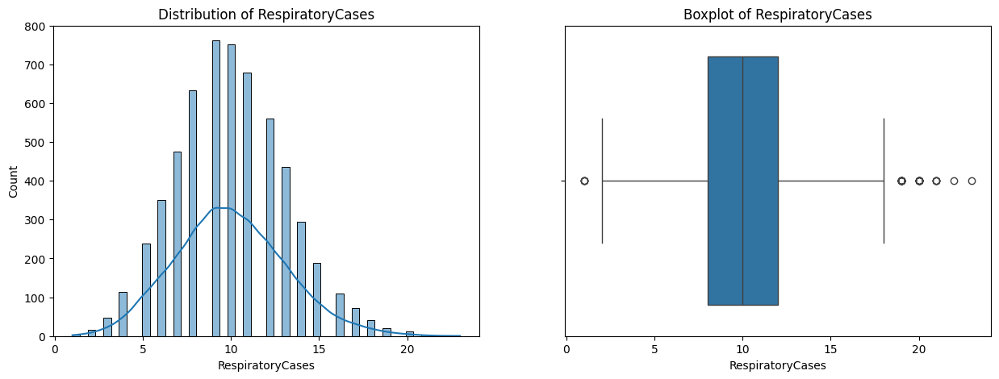

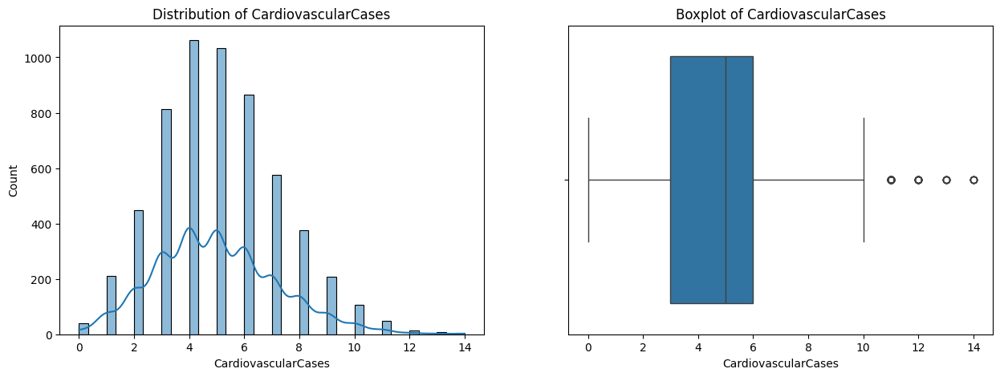

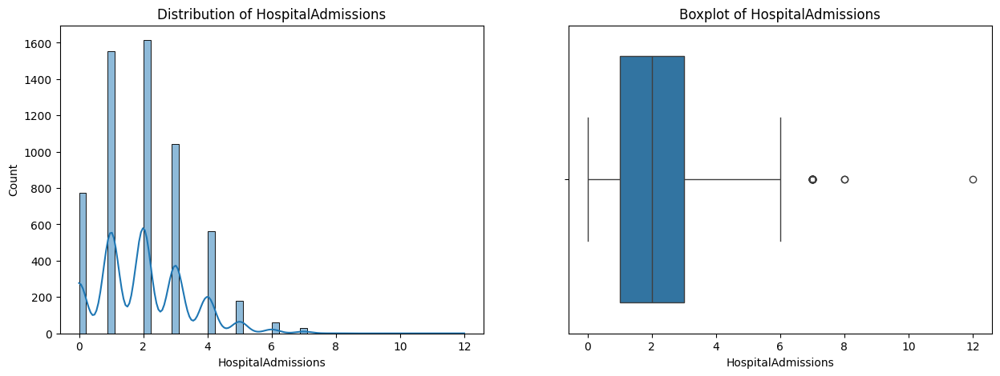

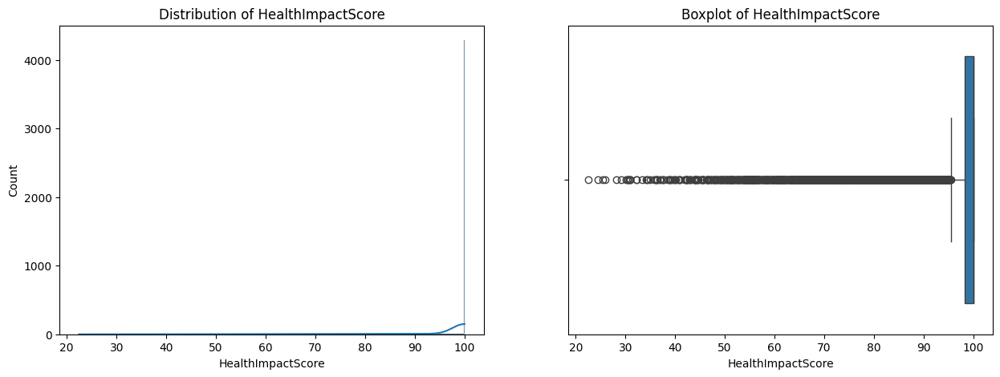

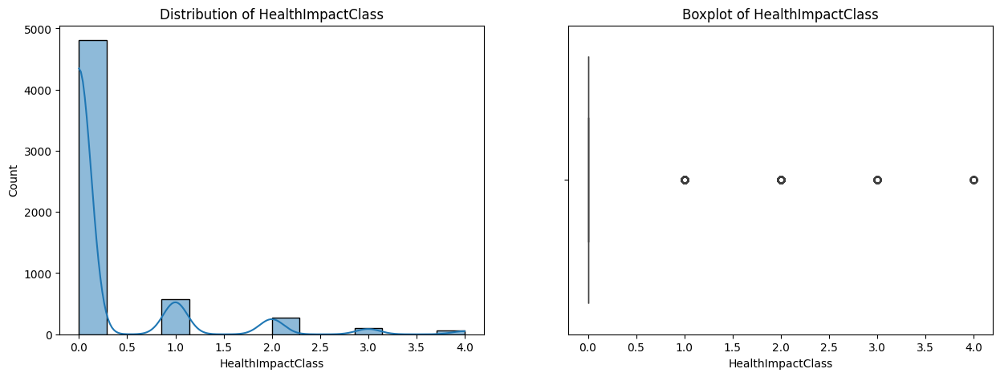

In [14]:
numerical_columns = df.select_dtypes(include='number')

for i, column in enumerate(numerical_columns, 1):
    plt.figure(figsize=(15, 5))

    # Create histogram on the left side
    plt.subplot(1, 2, 1)
    sns.histplot(data=df, x=column, kde=True)
    plt.title(f'Distribution of {column}')

    # Create boxplot on the right side
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')

    plt.show()

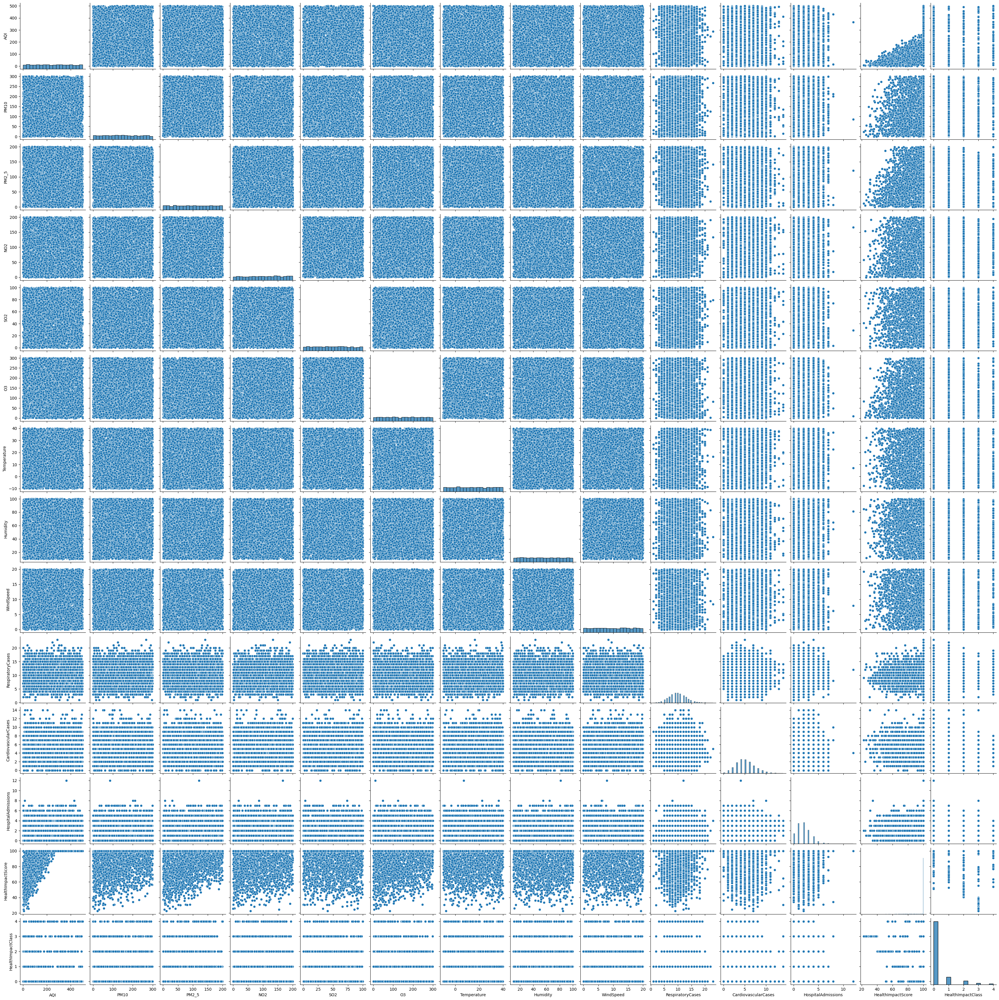

In [15]:
sns.pairplot(df)

# Data Preprocessing

In [16]:
X = df.drop(columns='HealthImpactScore')
y = df['HealthImpactScore']

In [17]:
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Models Training and Evaluation

In [24]:
# split data into train, val, and test

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.20, random_state=42)

In [25]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor

In [26]:
# instantiate models

lr = LinearRegression()
rf = RandomForestRegressor(random_state=42)
xgb = XGBRegressor(random_state=42)
knn = KNeighborsRegressor()
svr = SVR()
dt = DecisionTreeRegressor()
mlp = MLPRegressor(random_state=42)

In [27]:
# create a dictionary of models

models = {'LINEAR REGRESSION': lr,
            'RANDOM FOREST': rf,
            'XGBoost': xgb,
            'KNN': knn,
            'SVM': svr,
            'DECISION TREE': dt,
            'MLP': mlp}

# train the model

lr.fit(X_train, y_train)
rf.fit(X_train, y_train)
xgb.fit(X_train, y_train)
knn.fit(X_train, y_train)
svr.fit(X_train, y_train)
dt.fit(X_train, y_train)
mlp.fit(X_train, y_train)

MLPRegressor(random_state=42)

In [28]:
# create empty dictionary to store the results

results = {
    'MODELS' : [],
    'RMSE_TRAIN' : [],
    'RMSE_VAL' : [],
    'RMSE_TEST' : [],
    'MAE_TRAIN' : [],
    'MAE_VAL' : [],
    'MAE_TEST' : []
}

In [29]:
# iterate over the models dictionary and predict train, val, and test sets, calculate RMSE and MAE, store the results in the dictionary

for name, model in models.items():
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)
    
    rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
    rmse_val = mean_squared_error(y_val, y_val_pred, squared=False)
    rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
    
    mae_train = mean_absolute_error(y_train, y_train_pred)
    mae_val = mean_absolute_error(y_val, y_val_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    
    results['MODELS'].append(name)
    results['RMSE_TRAIN'].append(rmse_train)
    results['RMSE_VAL'].append(rmse_val)
    results['RMSE_TEST'].append(rmse_test)
    results['MAE_TRAIN'].append(mae_train)
    results['MAE_VAL'].append(mae_val)
    results['MAE_TEST'].append(mae_test)

In [30]:
# create a dataframe from the results dictionary

df_results = pd.DataFrame(results)
df_results.sort_values(by='RMSE_TEST', ascending=True)

,MODELS,RMSE_TRAIN,RMSE_VAL,RMSE_TEST,MAE_TRAIN,MAE_VAL,MAE_TEST
3,KNN,2.442788,2.973048,3.063412,1.065391,1.308800,1.441520
2,XGBoost,0.182702,2.862987,3.151826,0.111114,1.385493,1.551705
1,RANDOM FOREST,1.252891,3.136828,3.898441,0.545994,1.500241,1.756933
4,SVM,4.100024,4.432839,4.455589,2.428100,2.587901,2.634895
5,DECISION TREE,0.000000,4.889234,5.695948,0.000000,1.916151,2.261857
0,LINEAR REGRESSION,7.782332,7.751726,8.092445,5.719357,5.691695,5.925668
6,MLP,7.711349,8.727222,8.619749,5.819486,6.683050,6.570459


In [31]:
import pickle

In [32]:
# Save the model to a file
with open('knn_model.pkl', 'wb') as file:
    pickle.dump(knn, file)